# EntropyFlow



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
import pandas as pd
from scipy.spatial.distance import cdist
import seaborn as sns
import sys, os
from matplotlib.animation import FuncAnimation


In [ ]:
class EntropyFlow:

    def __init__(self, n_clusters=5, initial_temp=2, cooling_rate=0.95, min_temp=0.1, max_iter=100) :

                 self.n_clusters = n_clusters
                 self.temperature = initial_temp
                 self.initial_temp = initial_temp
                 self.cooling_rate = cooling_rate
                 self.min_temp = min_temp
                 self.max_iter = max_iter
                 self.cluster_centers_ = None
                 self.labels_ = None
                 self.history = {
                    'temperature': [],
                    'energy': [],
                    'entropy': [],
                    'free_energy': [],
                    'centers': []
                }


    def calculate_energy_matrix(self, X, centers):
        distances = cdist(X, centers)    # shape (N, K)
        return distances**2


    def calculate_probabilities(self, energy_matrix, temperature=None):
        if temperature is None:
            temperature = self.temperature

        exp_term = np.exp(-energy_matrix / temperature)
        Z = np.sum(exp_term, axis=1, keepdims=True)
        return exp_term / Z


    def _calculate_thermodynamics(self, X):

        # energy
        energy_matrix = self.calculate_energy_matrix(X, self.cluster_centers_)
        probs = self.calculate_probabilities(energy_matrix)
        energy = np.sum(probs * energy_matrix)

        # entropy
        probs = np.clip(probs, 1e-10, 1.0) # avoid log(0)
        entropy = -np.sum(probs * np.log(probs))

        # free energy
        free_energy = energy - self.temperature * entropy

        return free_energy, energy, entropy, probs


    def _get_updated_centers(self, X, probabilities):
        weighted_sum = np.dot(probabilities.T, X)
        weights_sum = np.sum(probabilities, axis=0)
        weights_sum = np.maximum(weights_sum, 1e-8) # avoid division by zero
        return weighted_sum / weights_sum[:, np.newaxis]


    def fit(self, X):

        n_samples, n_features = X.shape

        # initialize cluster centers
        idx = np.random.choice(n_samples, self.n_clusters, replace=False)
        self.cluster_centers_ = X[idx].copy()

        iteration = 0
        while self.temperature > self.min_temp and iteration < self.max_iter:

            F, U, S, probs = self._calculate_thermodynamics(X)

            self.history['temperature'].append(self.temperature)
            self.history['energy'].append(U)
            self.history['entropy'].append(S)
            self.history['free_energy'].append(F)
            self.history['centers'].append(self.cluster_centers_.copy())

            # updates
            self.cluster_centers_ = self._get_updated_centers(X, probs)
            self.temperature *= self.cooling_rate
            iteration += 1


        self.labels_ = self.predict(X)
        return self

    def predict(self, X):
        """Assign each point to the closest cluster center"""
        distances = cdist(X, self.cluster_centers_)
        return np.argmin(distances, axis=1)

## Plot Functions

In [ ]:
def plot_thermodynamics_qunantities(history):
    T = history['temperature']
    plt.plot(T, history['energy'], 'r-', label='Energy')
    plt.plot(T, history['entropy'], 'g-', label='Entropy')
    plt.plot(T, history['free_energy'], 'b-', label='Free Energy')
    plt.xlabel('T')
    plt.title('System Thermodynamics during Cooling')
    plt.legend()
    plt.grid(True)


def plot_phase_transitions(history):
    from scipy.signal import find_peaks, savgol_filter

    T, F = history['temperature'], history['free_energy']
    T = np.array(T)
    F = savgol_filter(F, window_length=15, polyorder=3)  # smooth F


    dFdT = np.gradient(F, T)        # first derivative
    d2FdT2 = np.gradient(dFdT, T)   # second derivative

    # Find transitions (peaks in derivatives)
    peaks_1st, _ = find_peaks(np.abs(dFdT), height = 1.5*np.std(dFdT))
    peaks_2nd, _ = find_peaks(d2FdT2, height = 1.5*np.std(d2FdT2))


    plt.figure(figsize=(6, 14))

    #
    plt.subplot(3, 1, 1)
    plt.plot(T, F, 'k-',)
    plt.xlabel("T")
    plt.ylabel("F")
    plt.grid()

    # First derivative
    plt.subplot(3, 1, 2)
    plt.plot(T, dFdT, 'k-', label="dF/dT")
    plt.scatter(T[peaks_1st], dFdT[peaks_1st], c='r', label="1st-order candidates")
    plt.xlabel("T")
    plt.title("First Derivative (Jumps → 1st-order transitions)", fontsize=10)
    plt.legend()
    plt.grid()

    # Second derivative
    plt.subplot(3, 1, 3)
    plt.plot(T, d2FdT2, 'k-', label="d²F/dT²")
    plt.scatter(T[peaks_2nd], d2FdT2[peaks_2nd], c='g', label="2nd-order candidates")
    plt.xlabel("T")
    plt.title("Second Derivative (Peaks → 2nd-order transitions)", fontsize=10)
    plt.legend()
    plt.grid()

    print(f"1st-order candidates: {T[peaks_1st]}")
    print(f"2nd-order candidates: {T[peaks_2nd]}")

    plt.tight_layout()
    plt.show()


def plot_energy_landscape(model, X):

    if X.shape[1] == 2: # plot 2D data
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                            np.arange(y_min, y_max, 0.1))
        grid_points = np.c_[xx.ravel(), yy.ravel()]

        energy_matrix = model.calculate_energy_matrix(grid_points,
                                                      model.cluster_centers_
                                                      )
        energy_map = np.min(energy_matrix, axis=1).reshape(xx.shape)


        # plot contour map
        plt.contourf(xx, yy, energy_map, cmap='viridis', alpha=0.8)
        plt.colorbar(label='Energy')
        plt.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1],
                    c='red', marker='*', s=200)
        plt.title('Energy Landscape')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')


def plot_true_and_predicted_labels(model, X, y):
    plt.figure(figsize=(6.5*2, 4.8))

    plt.subplot(1, 2, 1)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', alpha=0.5)
    plt.title('True Clusters')

    plt.subplot(1, 2, 2)
    plt.scatter(X[:, 0], X[:, 1], c=model.labels_, cmap='viridis', alpha=0.5)
    plt.title('Predicted Clusters')

In [ ]:
def create_animation(model, X):

    fig, ax = plt.subplots()

    scatter = ax.scatter(X[:, 0], X[:, 1], alpha=0.5)
    centers_scatter = ax.scatter([], [], c='r', marker='*', s=200)
    title = ax.set_title(f'T: {model.initial_temp:.2f}')

    def update(frame):
        centers = model.history['centers'][frame]
        temperature = model.history['temperature'][frame]
        energy = model.history['energy'][frame]
        entropy = model.history['entropy'][frame]
        free_energy = model.history['free_energy'][frame]

        energy_matrix = model.calculate_energy_matrix(X, centers)
        probs = model.calculate_probabilities(energy_matrix, temperature)
        labels = np.argmax(probs, axis=1)

        # update plot
        points_colors = plt.cm.viridis(labels / model.n_clusters)
        scatter.set_color(points_colors)

        centers_scatter.set_offsets(centers)

        title.set_text(f'T: {temperature:.2f}, E: {energy:.2f}, S: {entropy:.2f}, F: {free_energy:.2f}')

        return scatter, centers_scatter, title

    animation = FuncAnimation(fig, update,
                              frames = len(model.history['temperature']),
                              interval=200, blit=False)

    return animation

## Main Part

In [ ]:
def generate_sample_data(n_samples=1000, n_features=2,
                         n_clusters=5, random_state = 42):

    X, y = make_blobs(n_samples = n_samples,
                      n_features = n_features,
                      centers = n_clusters,
                      cluster_std = np.random.uniform(0.9, 1.1, n_clusters),
                      random_state = random_state
                      )

    X += np.random.normal(0, 0.1, X.shape) # add noise

    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    return X, y

In [ ]:
random_state = 42
n_samples = 1000
n_clusters = 5
n_features = 2


np.random.seed(random_state)

X, y = generate_sample_data(
    n_samples = n_samples,
    n_features = n_features,
    n_clusters = n_clusters,
    random_state=random_state,
    )

print(f"Dataset: {X.shape[0]} with {X.shape[1]} features")

print("Running EntropyFlow analysis...")
model = EntropyFlow(
    n_clusters = n_clusters,
    initial_temp = 5,
    cooling_rate = 0.95,
    min_temp = 0.1,
    max_iter = 1000
)
model.fit(X)

Dataset: 1000 with 2 features
Running EntropyFlow analysis...


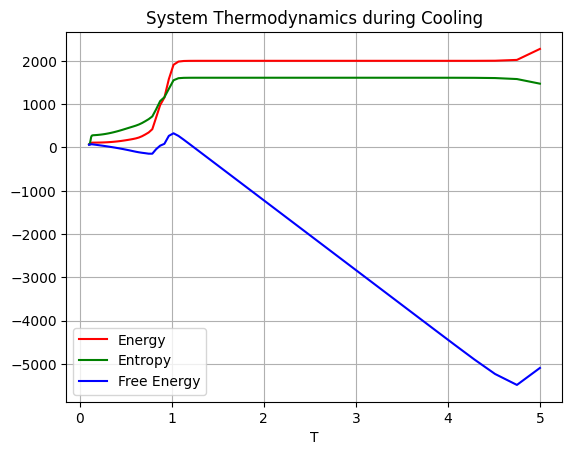

In [ ]:
plot_thermodynamics_qunantities(model.history)

1st-order candidates: [3.49168648 1.38694787 0.83041692]
2nd-order candidates: [0.71197871]


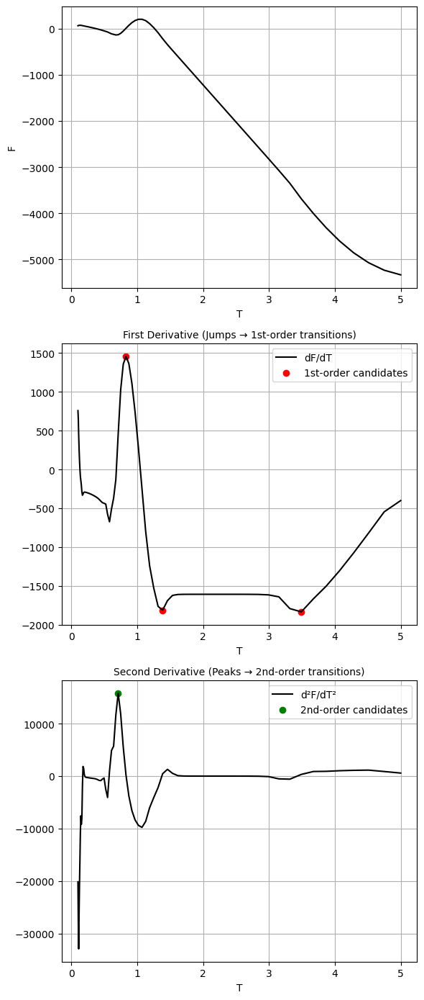

In [ ]:
plot_phase_transitions(model.history)

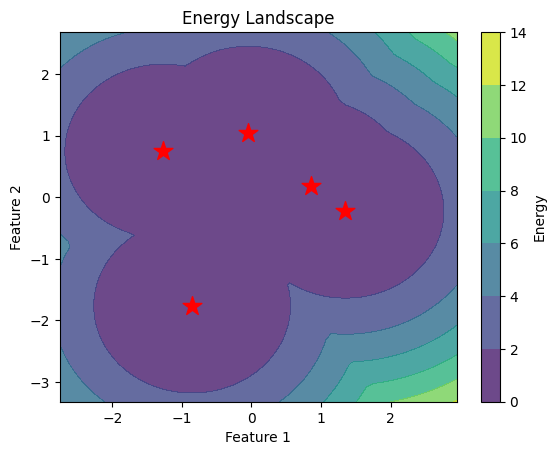

In [ ]:
plot_energy_landscape(model, X)

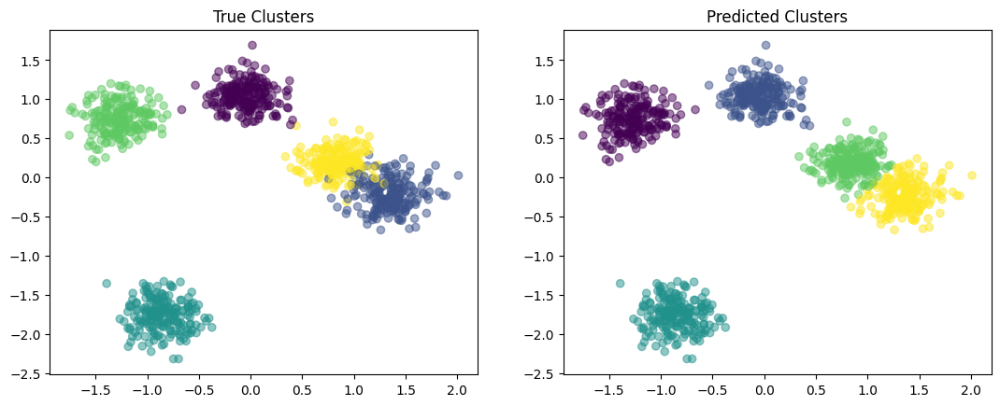

In [ ]:
plot_true_and_predicted_labels(model, X, y)

In [ ]:
# Metrics

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

y_pred = model.predict(X)
ari = adjusted_rand_score(y, y_pred)
nmi = normalized_mutual_info_score(y, model.labels_)
print(f"ARI_EntropyFlow: {ari:.3f}, NMI_EntropyFlow: {nmi:.3f}")


# k-Means model
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_pred = kmeans.fit_predict(X)
ari = adjusted_rand_score(y, y_pred)
nmi = normalized_mutual_info_score(y, y_pred)
print(f"ARI_kMeans: {ari:.3f}, NMI_kMeans: {nmi:.3f}", )


ARI_EntropyFlow: 0.941, NMI_EntropyFlow: 0.940
ARI_kMeans: 0.724, NMI_kMeans: 0.856


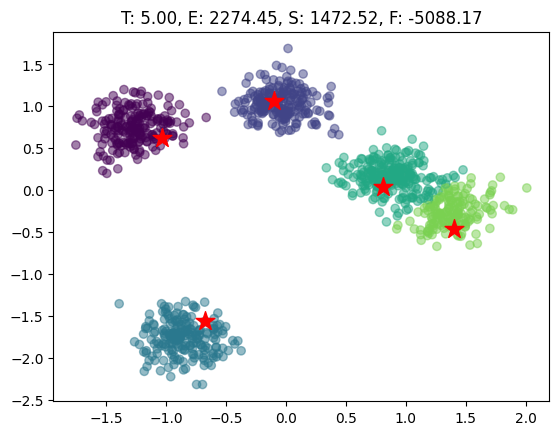

In [ ]:
# Animation
ani = create_animation(model, X)
from IPython.display import HTML
HTML(ani.to_jshtml())